<a href="https://colab.research.google.com/github/seeun7/face/blob/main/svdimg.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

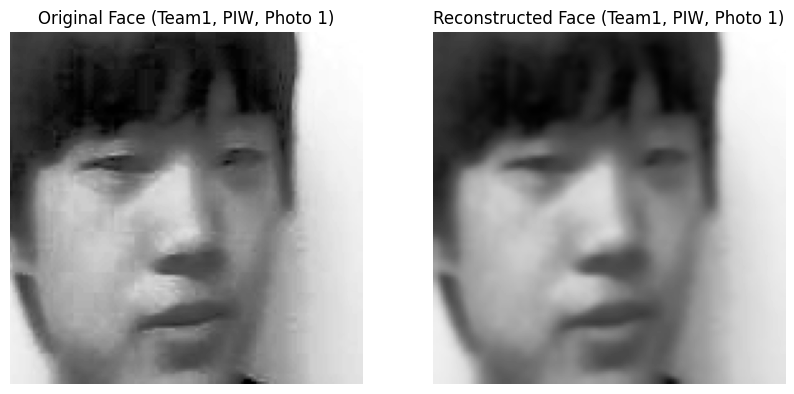

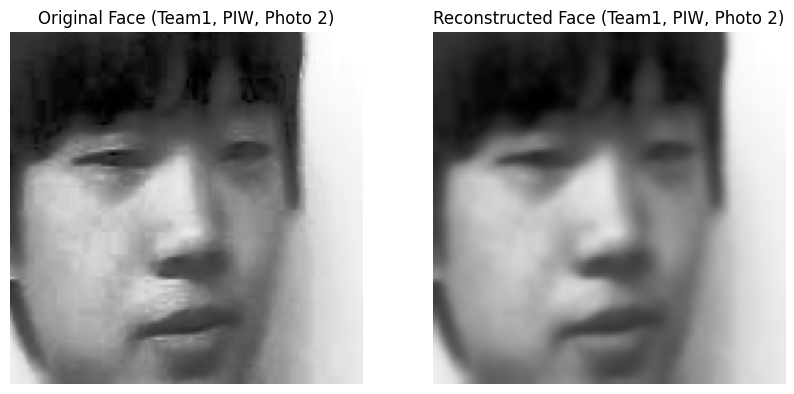

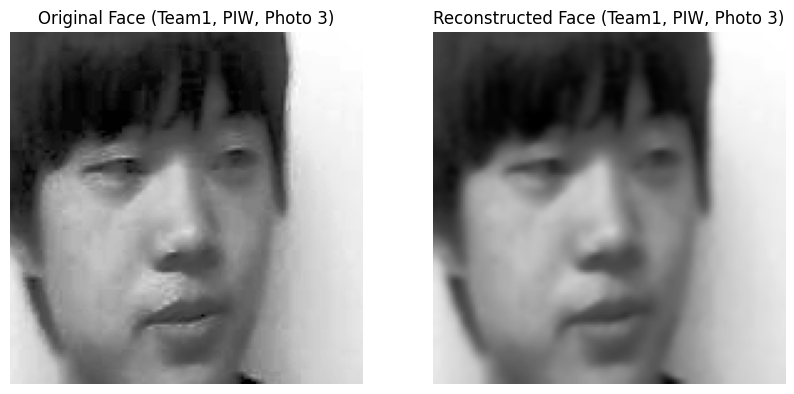

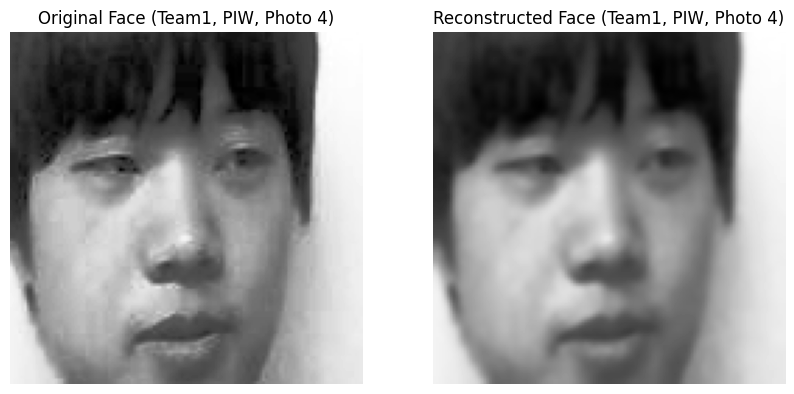

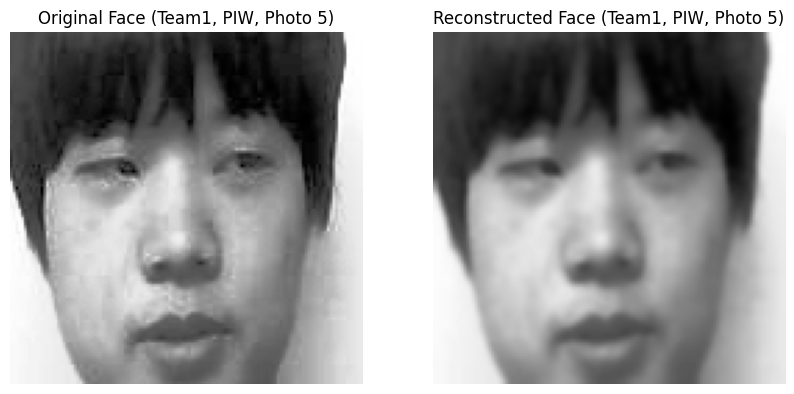

...

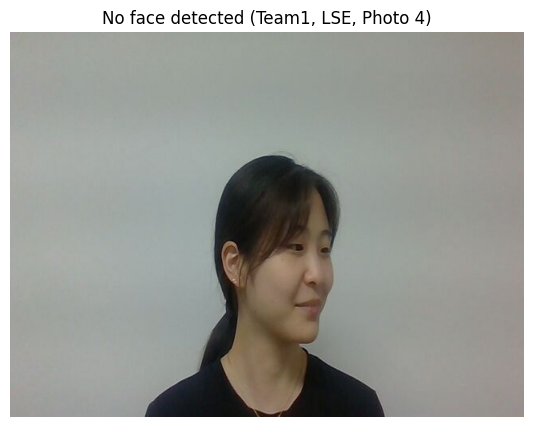

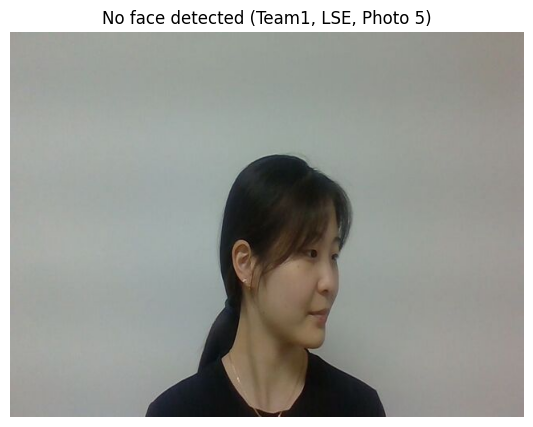

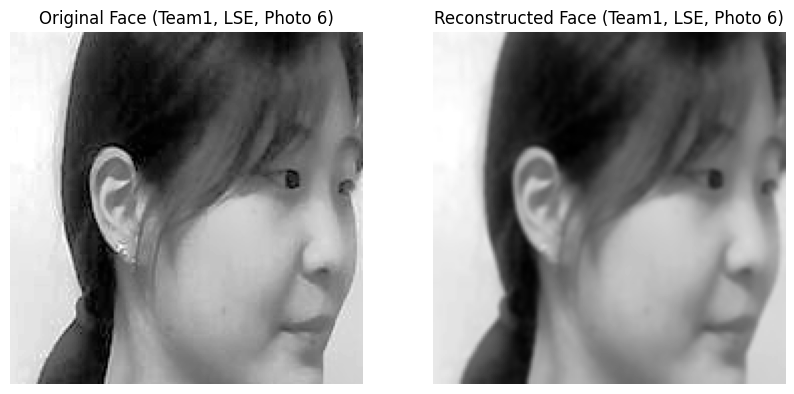

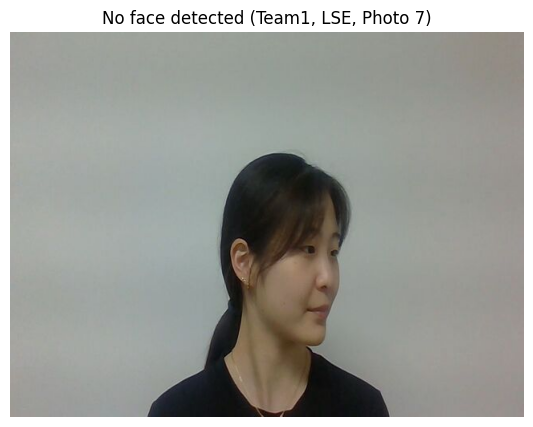

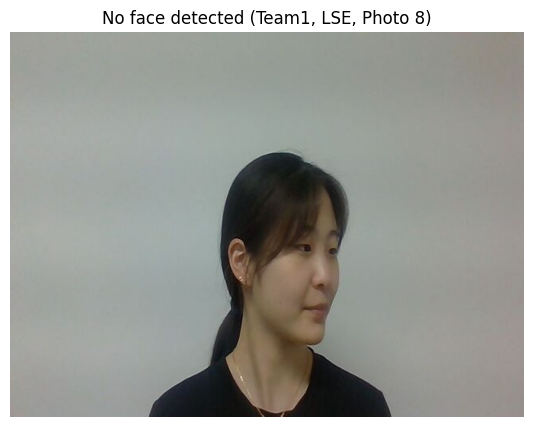

Image Team2_001_AAA_0001.jpg not found.
Image Team2_001_AAA_0002.jpg not found.
Image Team2_001_AAA_0003.jpg not found.
Image Team2_001_AAA_0004.jpg not found.
Image Team2_001_AAA_0005.jpg not found.
Image Team2_001_AAA_0006.jpg not found.
Image Team2_001_AAA_0007.jpg not found.
Image Team2_001_AAA_0008.jpg not found.
Image Team2_002_BBB_0001.jpg not found.
Image Team2_002_BBB_0002.jpg not found.
Image Team2_002_BBB_0003.jpg not found.
Image Team2_002_BBB_0004.jpg not found.
Image Team2_002_BBB_0005.jpg not found.
Image Team2_002_BBB_0006.jpg not found.
Image Team2_002_BBB_0007.jpg not found.
Image Team2_002_BBB_0008.jpg not found.
Image Team2_003_CCC_0001.jpg not found.
Image Team2_003_CCC_0002.jpg not found.
Image Team2_003_CCC_0003.jpg not found.
Image Team2_003_CCC_0004.jpg not found.
Image Team2_003_CCC_0005.jpg not found.
Image Team2_003_CCC_0006.jpg not found.
Image Team2_003_CCC_0007.jpg not found.
Image Team2_003_CCC_0008.jpg not found.
Image Team2_004_DDD_0001.jpg not found.


In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 전처리 클래스
class Preprocessor:
    def __init__(self, k=50):
        self.k = k

    def equalize_histogram(self, image):
        return cv2.equalizeHist(image)

    def apply_gaussian_blur(self, image, kernel_size=(5, 5)):
        return cv2.GaussianBlur(image, kernel_size, 0)

    def perform_svd(self, image):
        U, S, VT = np.linalg.svd(image.astype(float))
        return U, S, VT

    def reconstruct_image(self, U, S, VT):
        return np.dot(U[:, :self.k], np.dot(np.diag(S[:self.k]), VT[:self.k, :]))

    def preprocess(self, face_img):
        face_img_equalized = self.equalize_histogram(face_img)
        face_img_blurred = self.apply_gaussian_blur(face_img_equalized)
        U, S, VT = self.perform_svd(face_img_blurred)
        reconstructed_face = self.reconstruct_image(U, S, VT)
        return face_img_equalized, reconstructed_face

# 얼굴 검출 클래스
class FaceDetector:
    def __init__(self, frontal_cascade_path=cv2.data.haarcascades + 'haarcascade_frontalface_default.xml',
                       profile_cascade_path=cv2.data.haarcascades + 'haarcascade_profileface.xml'):
        self.frontal_cascade = cv2.CascadeClassifier(frontal_cascade_path)
        self.profile_cascade = cv2.CascadeClassifier(profile_cascade_path)

    def detect_faces(self, image):
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        frontal_faces = self.frontal_cascade.detectMultiScale(gray, 1.3, 5)
        profile_faces = self.profile_cascade.detectMultiScale(gray, 1.3, 5)
        faces = list(frontal_faces) + list(profile_faces)  # 정면 얼굴과 측면 얼굴을 통합
        return faces, gray

# 메인 함수

# 팀원 이름과 번호 리스트
team_1_members = ['001_PIW', '002_KHH', '003_CSB', '004_KDM', '005_LSE']
team_2_members = ['001_AAA', '002_BBB', '003_CCC', '004_DDD']

# 팀 목록
teams = {
    'Team1': team_1_members,
    'Team2': team_2_members
}

# 얼굴 전처리기와 검출기 인스턴스 생성
preprocessor = Preprocessor(k=100)
detector = FaceDetector()

for team_name, members in teams.items():
    for member in members:
        for photo_num in range(1, 9):  # 사진의 개수는 조정
            image_path = f'{team_name}_{member}_{photo_num:04d}.jpg'
            image = cv2.imread(image_path)
            if image is None:
                print(f"Image {image_path} not found.")
                continue

            faces, gray = detector.detect_faces(image)
            member_display_name = member.split('_')[1]

            if len(faces) == 0:
                # 얼굴이 인식되지 않으면 테두리 없는 사진을 출력
                plt.figure(figsize=(10, 5))
                plt.title(f"No face detected ({team_name}, {member_display_name}, Photo {photo_num})")
                plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
                plt.axis('off')
                plt.show()
                continue

            # 얼굴 전처리 및 재구성
            for (x, y, w, h) in faces:
                # 얼굴 부분 이미지 추출
                face_img = gray[y:y+h, x:x+w]

                face_img_equalized, reconstructed_face = preprocessor.preprocess(face_img)

                # 시각화
                plt.figure(figsize=(10, 5))

                plt.subplot(1, 2, 1)
                plt.title(f"Original Face ({team_name}, {member_display_name}, Photo {photo_num})")
                plt.imshow(face_img_equalized, cmap='gray')
                plt.axis('off')

                plt.subplot(1, 2, 2)
                plt.title(f"Reconstructed Face ({team_name}, {member_display_name}, Photo {photo_num})")
                plt.imshow(reconstructed_face, cmap='gray')
                plt.axis('off')

                plt.show()

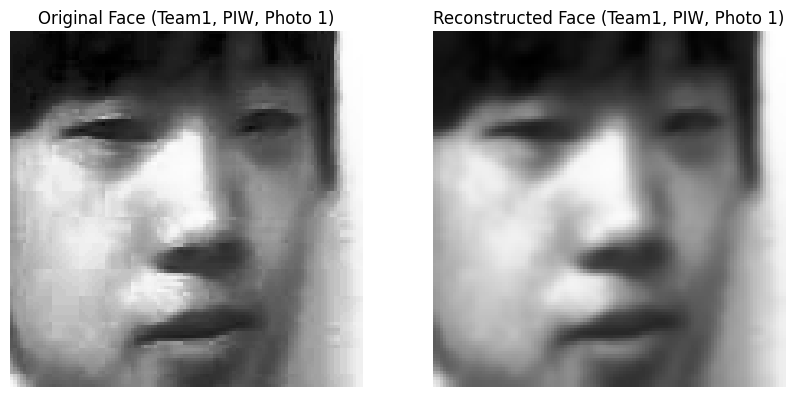

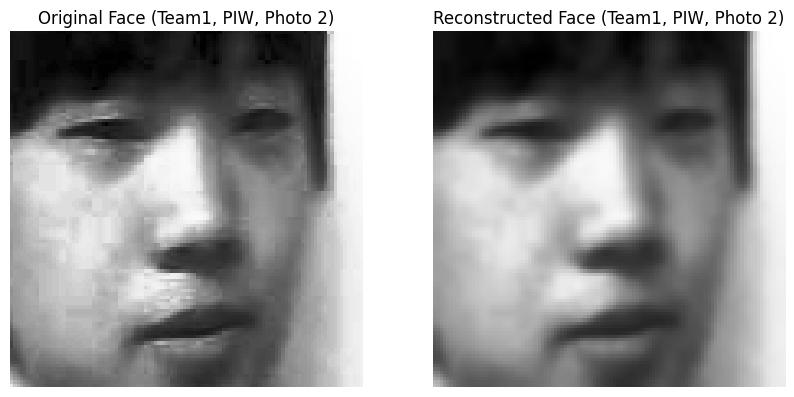

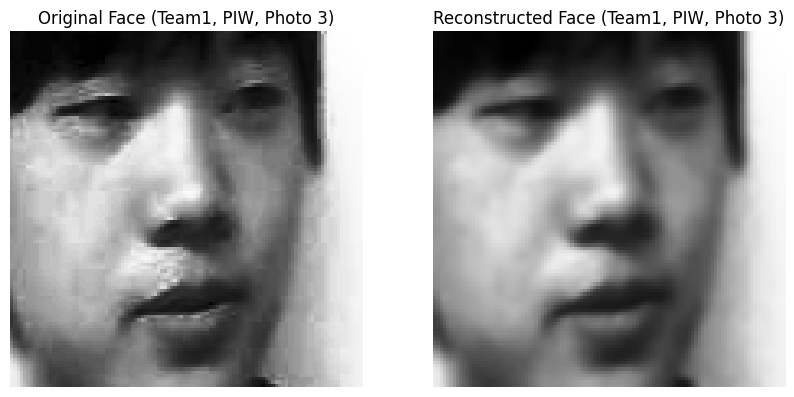

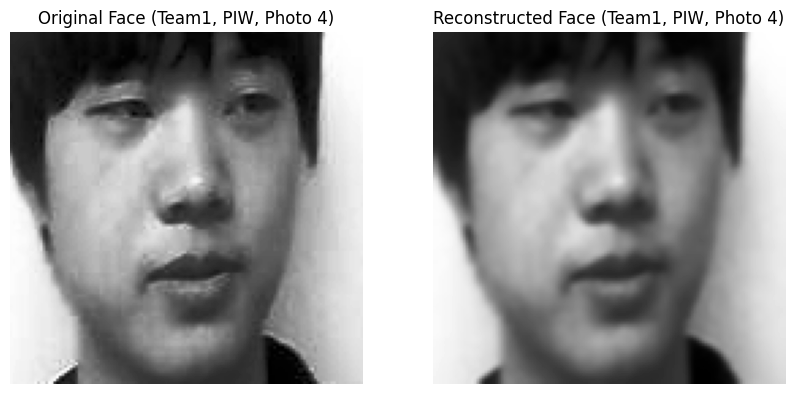

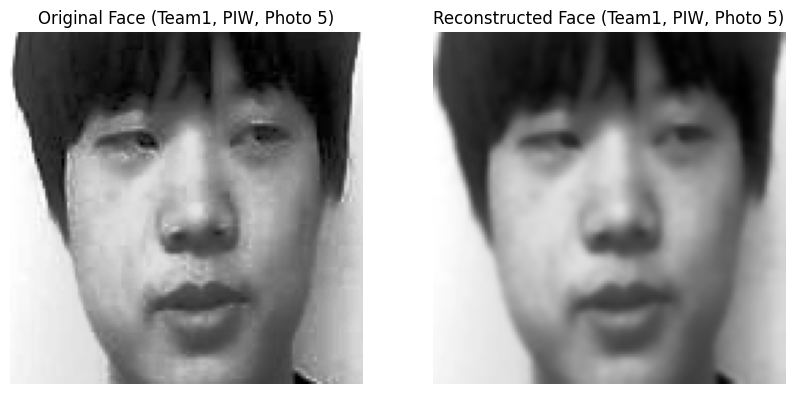

...

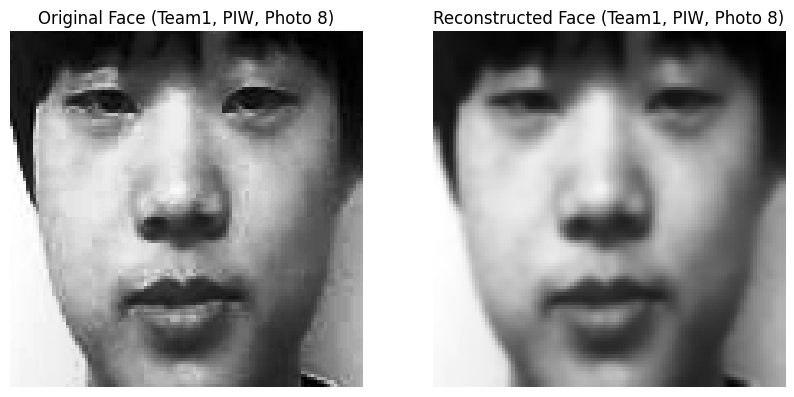

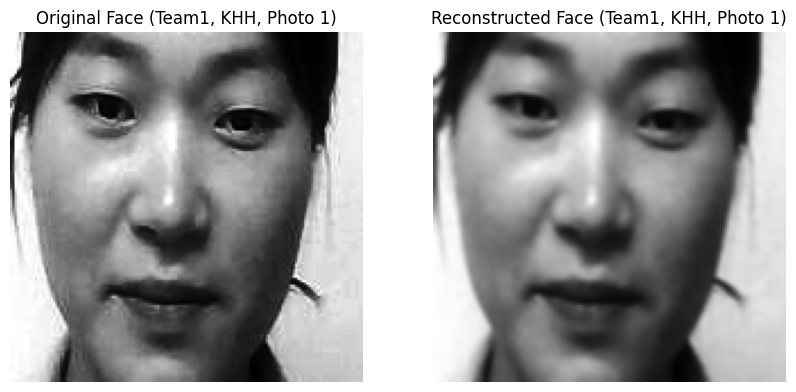

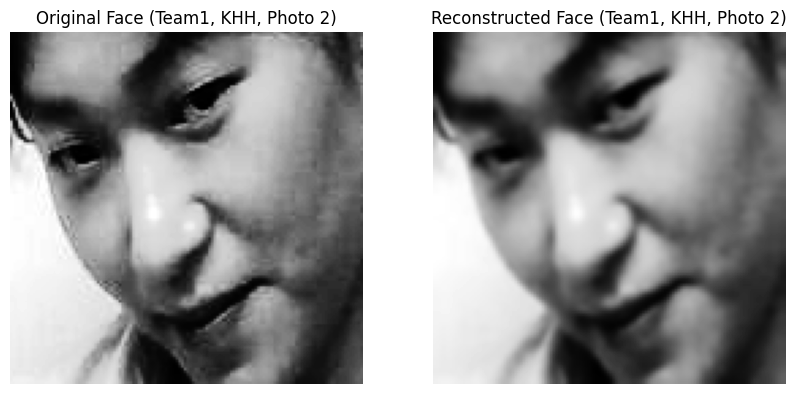

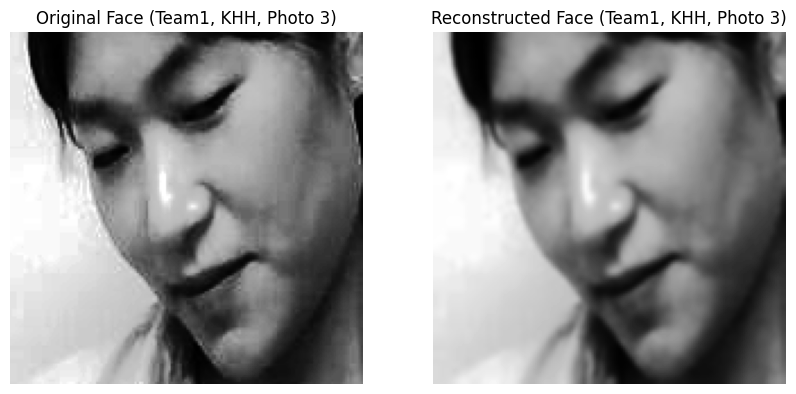

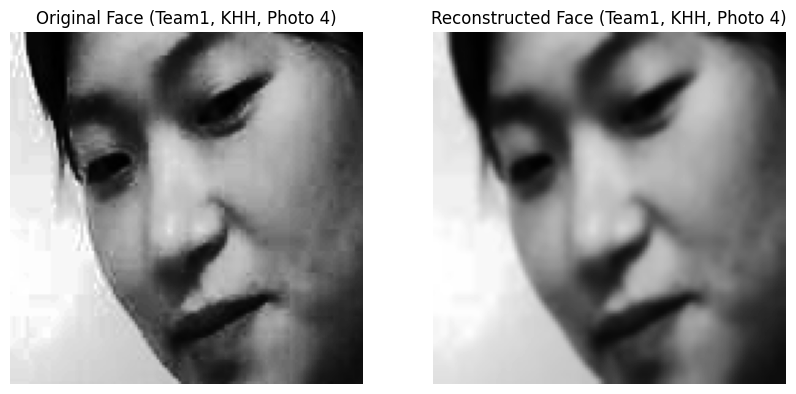

이미지가 너무 작습니다.: (63, 63)


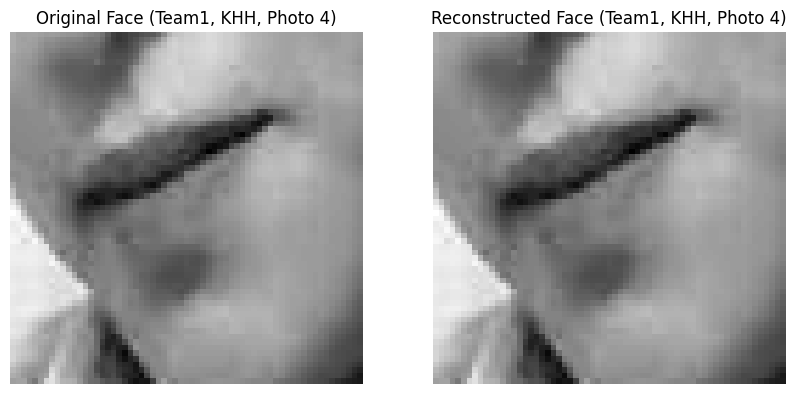

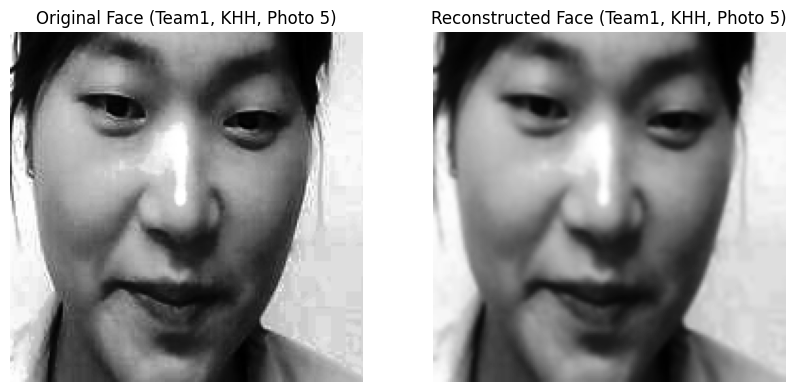

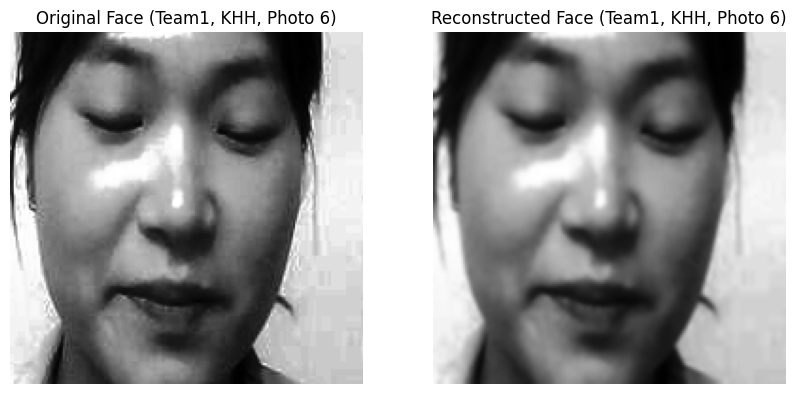

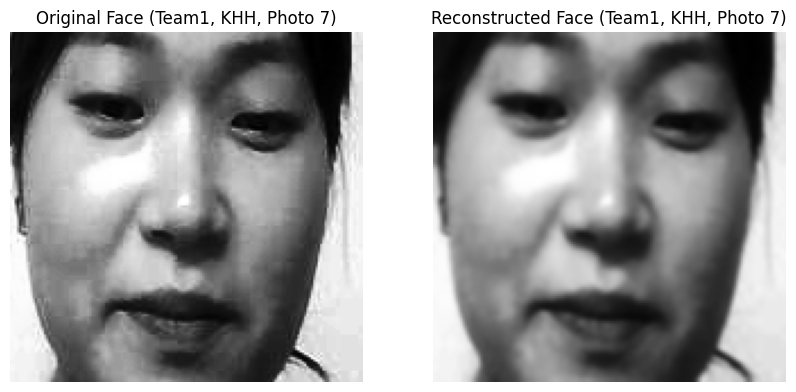

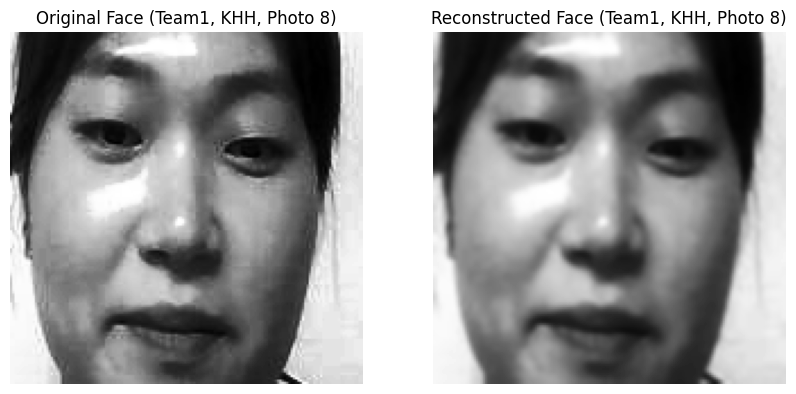

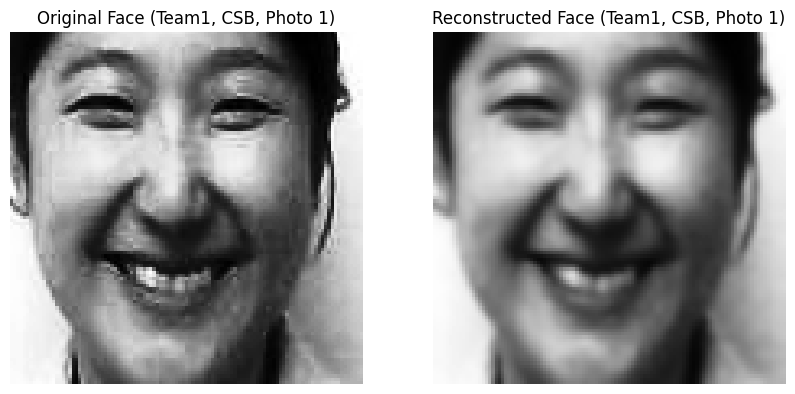

이미지가 너무 작습니다.: (91, 90)


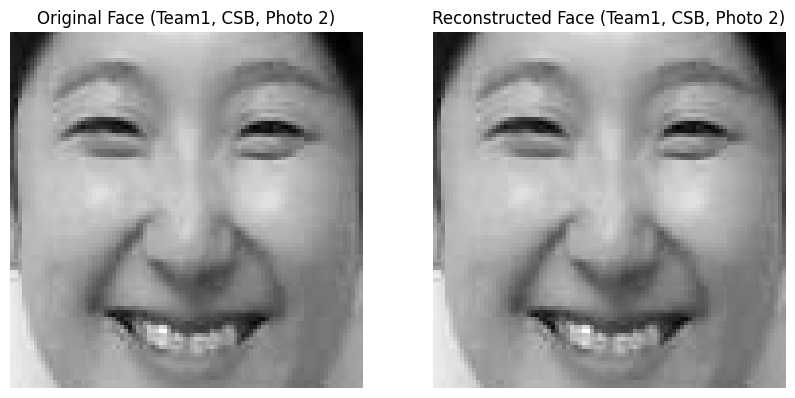

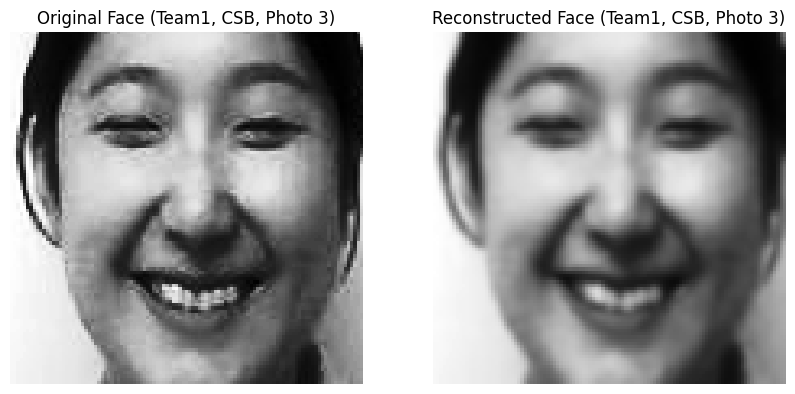

이미지가 너무 작습니다.: (90, 90)


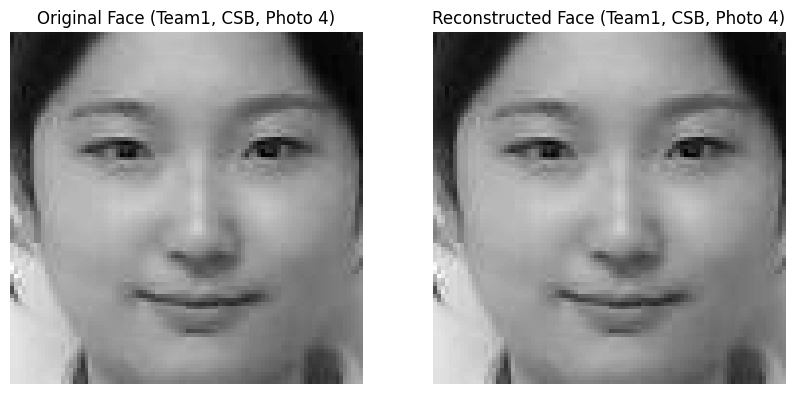

이미지가 너무 작습니다.: (90, 90)


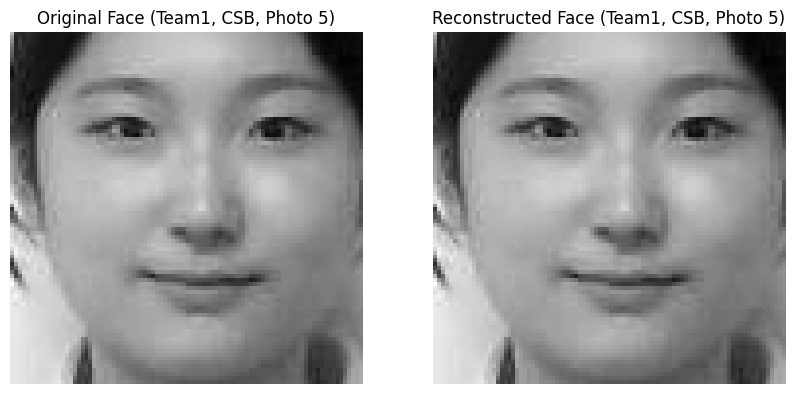

이미지가 너무 작습니다.: (90, 90)


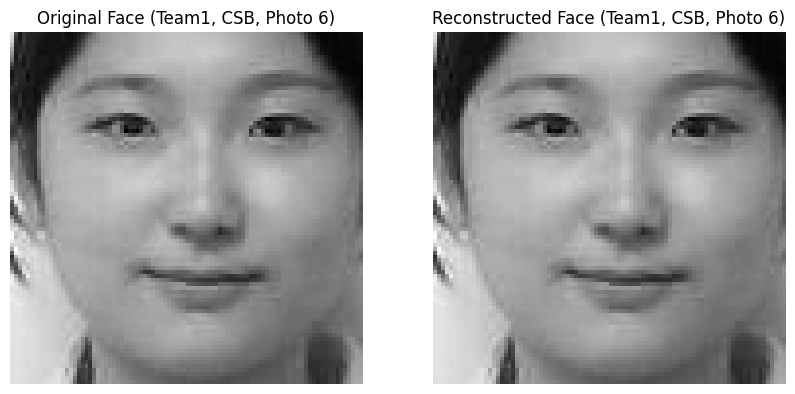

이미지가 너무 작습니다.: (90, 90)


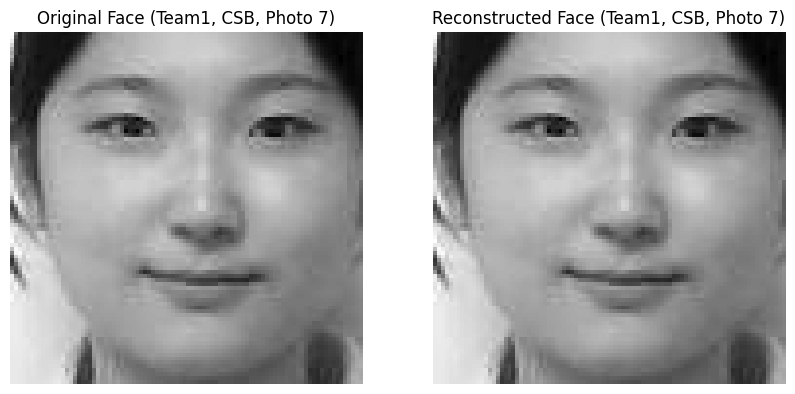

이미지가 너무 작습니다.: (90, 90)


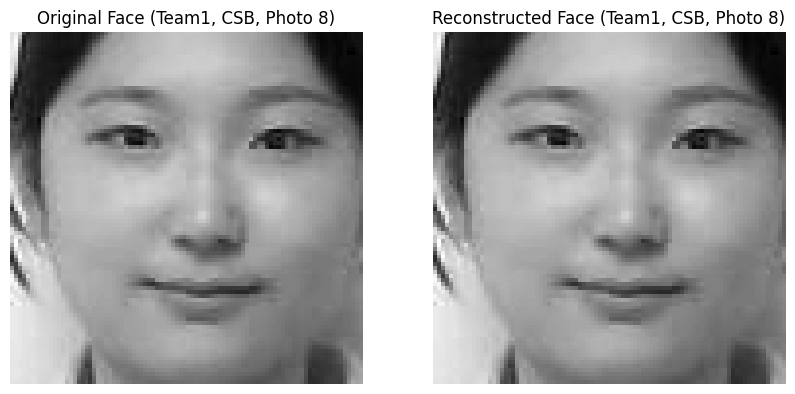

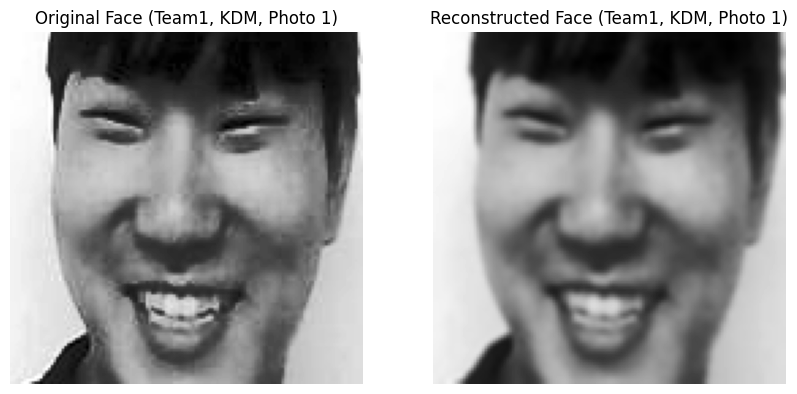

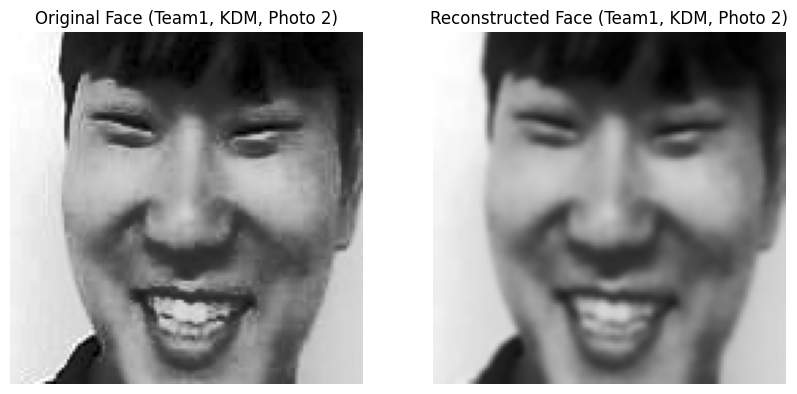

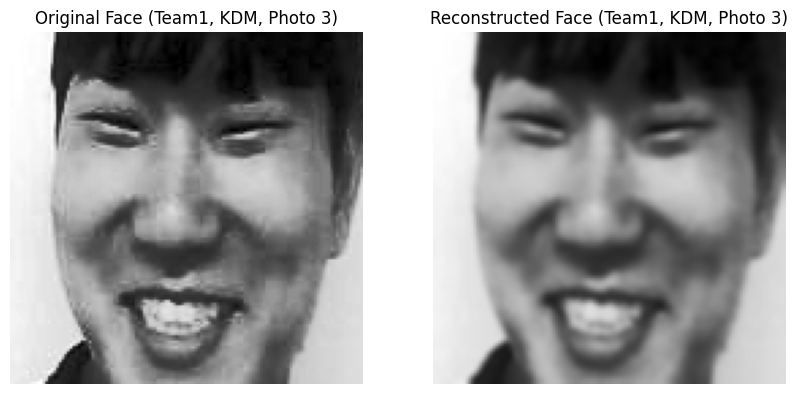

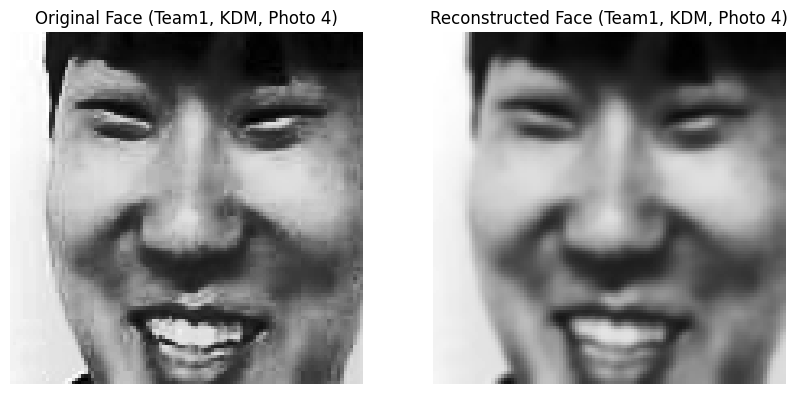

...

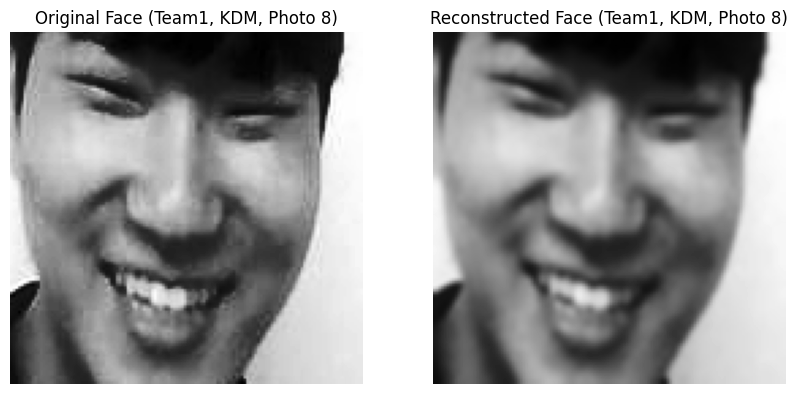

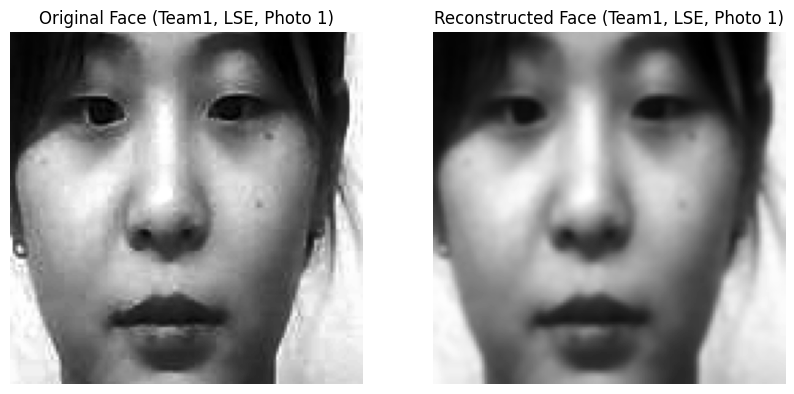

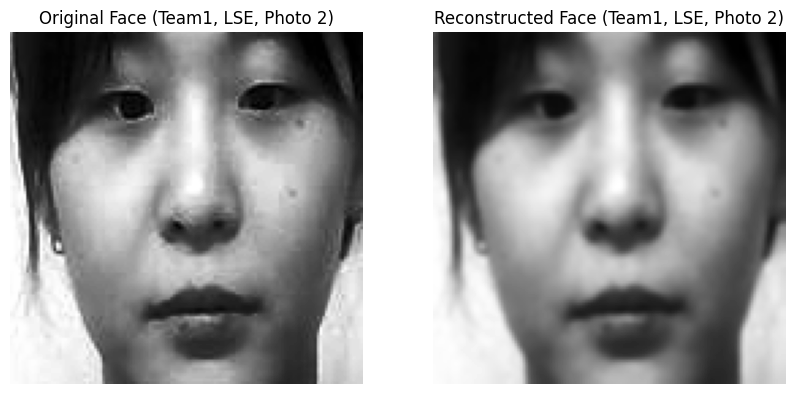

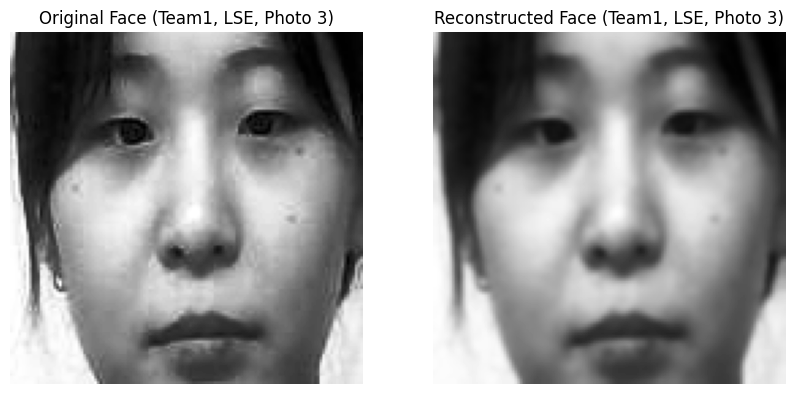

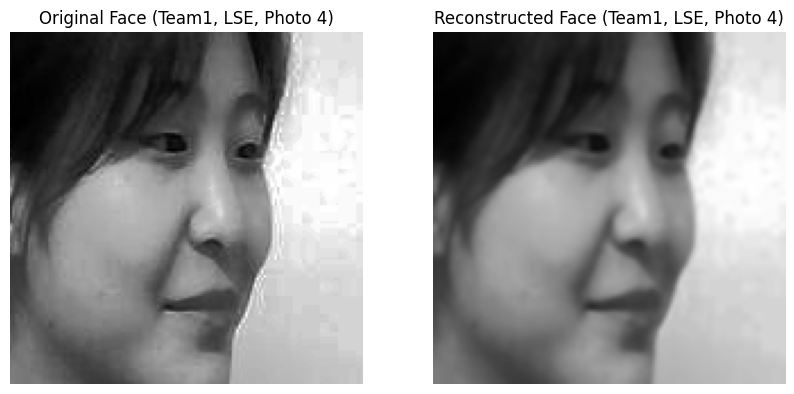

얼굴을 인식할 수 없습니다.
얼굴을 인식할 수 없습니다.


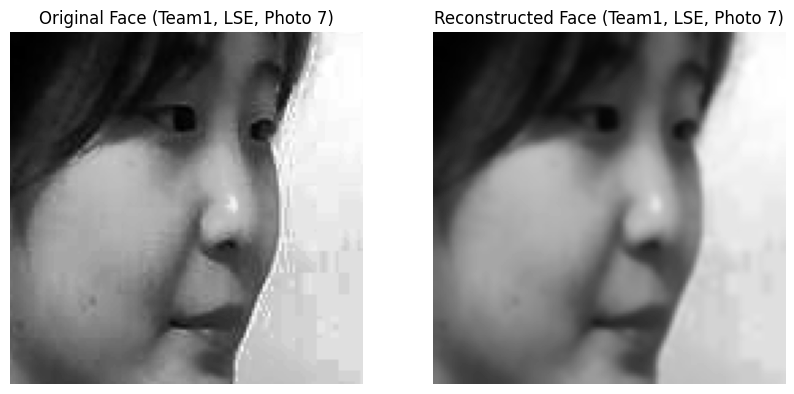

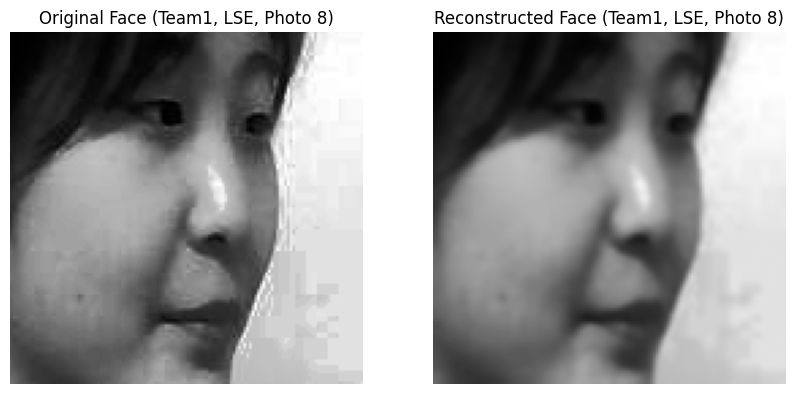

Image Team2_001_AAA_0001.jpg not found.
Image Team2_001_AAA_0002.jpg not found.
Image Team2_001_AAA_0003.jpg not found.
Image Team2_001_AAA_0004.jpg not found.
Image Team2_001_AAA_0005.jpg not found.
Image Team2_001_AAA_0006.jpg not found.
Image Team2_001_AAA_0007.jpg not found.
Image Team2_001_AAA_0008.jpg not found.
Image Team2_002_BBB_0001.jpg not found.
Image Team2_002_BBB_0002.jpg not found.
Image Team2_002_BBB_0003.jpg not found.
Image Team2_002_BBB_0004.jpg not found.
Image Team2_002_BBB_0005.jpg not found.
Image Team2_002_BBB_0006.jpg not found.
Image Team2_002_BBB_0007.jpg not found.
Image Team2_002_BBB_0008.jpg not found.
Image Team2_003_CCC_0001.jpg not found.
Image Team2_003_CCC_0002.jpg not found.
Image Team2_003_CCC_0003.jpg not found.
Image Team2_003_CCC_0004.jpg not found.
Image Team2_003_CCC_0005.jpg not found.
Image Team2_003_CCC_0006.jpg not found.
Image Team2_003_CCC_0007.jpg not found.
Image Team2_003_CCC_0008.jpg not found.
Image Team2_004_DDD_0001.jpg not found.


In [5]:
import dlib
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 전처리 클래스
class Preprocessor:
    def __init__(self, k=50):
        self.k = k

    def equalize_histogram(self, image):
        return cv2.equalizeHist(image)

    def apply_gaussian_blur(self, image, kernel_size=(5, 5)):
        return cv2.GaussianBlur(image, kernel_size, 0)

    def perform_svd(self, image):
        U, S, VT = np.linalg.svd(image.astype(float))
        return U, S, VT

    def reconstruct_image(self, U, S, VT):
        return np.dot(U[:, :self.k], np.dot(np.diag(S[:self.k]), VT[:self.k, :]))

    def preprocess(self, face_img):
        # 이미지가 너무 작으면 전처리를 건너뜁니다.
        if face_img.shape[0] < self.k or face_img.shape[1] < self.k:
            print(f"이미지가 너무 작습니다.: {face_img.shape}")
            return face_img, face_img

        face_img_equalized = self.equalize_histogram(face_img)
        face_img_blurred = self.apply_gaussian_blur(face_img_equalized)
        U, S, VT = self.perform_svd(face_img_blurred)
        reconstructed_face = self.reconstruct_image(U, S, VT)
        return face_img_equalized, reconstructed_face

# 얼굴 검출 클래스
class FaceDetector:
    def __init__(self):
        self.detector = dlib.get_frontal_face_detector()

    def detect_faces(self, image):
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        faces = self.detector(gray, 1)
        # dlib.rectangle 객체를 (x, y, w, h) 형식으로 변환
        faces = [(face.left(), face.top(), face.width(), face.height()) for face in faces]
        return faces, gray

# 메인 함수

# 팀원 이름과 번호 리스트
team_1_members = ['001_PIW', '002_KHH', '003_CSB', '004_KDM', '005_LSE']
team_2_members = ['001_AAA', '002_BBB', '003_CCC', '004_DDD']

# 팀 목록
teams = {
    'Team1': team_1_members,
    'Team2': team_2_members
}

# 얼굴 전처리기와 검출기 인스턴스 생성
preprocessor = Preprocessor(k=100)
detector = FaceDetector()

for team_name, members in teams.items():
    for member in members:
        for photo_num in range(1, 9):  # 사진의 개수는 조정
            image_path = f'{team_name}_{member}_{photo_num:04d}.jpg'
            image = cv2.imread(image_path)
            if image is None:
                print(f"Image {image_path} not found.")
                continue

            faces, gray = detector.detect_faces(image)
            member_display_name = member.split('_')[1]

            if len(faces) == 0:
                print("얼굴을 인식할 수 없습니다.")
                continue

            # 얼굴 전처리 및 재구성
            for (x, y, w, h) in faces:
                # 얼굴 부분 이미지 추출
                face_img = gray[y:y+h, x:x+w]

                face_img_equalized, reconstructed_face = preprocessor.preprocess(face_img)

                # 시각화
                plt.figure(figsize=(10, 5))

                plt.subplot(1, 2, 1)
                plt.title(f"Original Face ({team_name}, {member_display_name}, Photo {photo_num})")
                plt.imshow(face_img_equalized, cmap='gray')
                plt.axis('off')

                plt.subplot(1, 2, 2)
                plt.title(f"Reconstructed Face ({team_name}, {member_display_name}, Photo {photo_num})")
                plt.imshow(reconstructed_face, cmap='gray')
                plt.axis('off')

                plt.show()